In [1]:
!pip install torch imageio transformers diffusers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 46.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 852.0/852.0 kB 36.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 44.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 9.3 MB/s eta 0:00:00


In [1]:
from diffusers import StableDiffusionControlNetPipeline
from diffusers.image_processor import VaeImageProcessor
from typing import Any, Callable, Dict, List, Optional, Tuple, Union
from diffusers.models import AutoencoderKL, UNet2DConditionModel, ControlNetModel
from diffusers.schedulers import KarrasDiffusionSchedulers
from transformers import CLIPImageProcessor, CLIPTextModel, CLIPTokenizer
from diffusers.pipelines.stable_diffusion.safety_checker import StableDiffusionSafetyChecker
from diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_controlnet import MultiControlNetModel
import numpy as np
import PIL.Image
import torch
from torch import nn
from diffusers.utils import (
    deprecate,
    replace_example_docstring,
    randn_tensor,
)
from diffusers.pipelines.stable_diffusion import StableDiffusionPipelineOutput

EXAMPLE_DOC_STRING = """
    Examples:
        ```py
        >>> # !pip install opencv-python transformers accelerate
        >>> from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
        >>> from diffusers.utils import load_image
        >>> import numpy as np
        >>> import torch
        >>> import cv2
        >>> from PIL import Image
        >>> # download an image
        >>> image = load_image(
        ...     "https://hf.co/datasets/huggingface/documentation-images/resolve/main/diffusers/input_image_vermeer.png"
        ... )
        >>> image = np.array(image)
        >>> # get canny image
        >>> image = cv2.Canny(image, 100, 200)
        >>> image = image[:, :, None]
        >>> image = np.concatenate([image, image, image], axis=2)
        >>> canny_image = Image.fromarray(image)
        >>> # load control net and stable diffusion v1-5
        >>> controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16)
        >>> pipe = StableDiffusionControlNetPipeline.from_pretrained(
        ...     "runwayml/stable-diffusion-v1-5", controlnet=controlnet, torch_dtype=torch.float16
        ... )
        >>> # speed up diffusion process with faster scheduler and memory optimization
        >>> pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
        >>> # remove following line if xformers is not installed
        >>> pipe.enable_xformers_memory_efficient_attention()
        >>> pipe.enable_model_cpu_offload()
        >>> # generate image
        >>> generator = torch.manual_seed(0)
        >>> image = pipe(
        ...     "futuristic-looking woman", num_inference_steps=20, generator=generator, image=canny_image
        ... ).images[0]
        ```
"""

class StableDiffusionControlNetImg2ImgPipeline(StableDiffusionControlNetPipeline):

    def __init__(
        self,
        vae: AutoencoderKL,
        text_encoder: CLIPTextModel,
        tokenizer: CLIPTokenizer,
        unet: UNet2DConditionModel,
        controlnet: Union[ControlNetModel, List[ControlNetModel], Tuple[ControlNetModel], MultiControlNetModel],
        scheduler: KarrasDiffusionSchedulers,
        safety_checker: StableDiffusionSafetyChecker,
        feature_extractor: CLIPImageProcessor,
        requires_safety_checker: bool = True,
    ):
        super().__init__(vae, text_encoder, tokenizer, unet, controlnet, scheduler, safety_checker, feature_extractor, requires_safety_checker)
        self.image_processor = VaeImageProcessor(vae_scale_factor=self.vae_scale_factor)

    def prepare_latents(self, image, timestep, batch_size, num_images_per_prompt, dtype, device, generator=None, noise_latents=None):
        if not isinstance(image, (torch.Tensor, PIL.Image.Image, list)):
            raise ValueError(
                f"`image` has to be of type `torch.Tensor`, `PIL.Image.Image` or list but is {type(image)}"
            )

        image = image.to(device=device, dtype=dtype)

        batch_size = batch_size * num_images_per_prompt
        if isinstance(generator, list) and len(generator) != batch_size:
            raise ValueError(
                f"You have passed a list of generators of length {len(generator)}, but requested an effective batch"
                f" size of {batch_size}. Make sure the batch size matches the length of the generators."
            )

        if isinstance(generator, list):
            init_latents = [
                self.vae.encode(image[i : i + 1]).latent_dist.sample(generator[i]) for i in range(batch_size)
            ]
            init_latents = torch.cat(init_latents, dim=0)
        else:
            init_latents = self.vae.encode(image).latent_dist.sample(generator)

        init_latents = self.vae.config.scaling_factor * init_latents

        if batch_size > init_latents.shape[0] and batch_size % init_latents.shape[0] == 0:
            # expand init_latents for batch_size
            deprecation_message = (
                f"You have passed {batch_size} text prompts (`prompt`), but only {init_latents.shape[0]} initial"
                " images (`image`). Initial images are now duplicating to match the number of text prompts. Note"
                " that this behavior is deprecated and will be removed in a version 1.0.0. Please make sure to update"
                " your script to pass as many initial images as text prompts to suppress this warning."
            )
            deprecate("len(prompt) != len(image)", "1.0.0", deprecation_message, standard_warn=False)
            additional_image_per_prompt = batch_size // init_latents.shape[0]
            init_latents = torch.cat([init_latents] * additional_image_per_prompt, dim=0)
        elif batch_size > init_latents.shape[0] and batch_size % init_latents.shape[0] != 0:
            raise ValueError(
                f"Cannot duplicate `image` of batch size {init_latents.shape[0]} to {batch_size} text prompts."
            )
        else:
            init_latents = torch.cat([init_latents], dim=0)

        shape = init_latents.shape
        if noise_latents==None:
          noise = randn_tensor(shape, generator=generator, device=device, dtype=dtype)
        else:
          noise = noise_latents
        # get latents
        init_latents = self.scheduler.add_noise(init_latents, noise, timestep)
        latents = init_latents

        return latents

    def get_timesteps(self, num_inference_steps, strength, device):
        # get the original timestep using init_timestep
        init_timestep = min(int(num_inference_steps * strength), num_inference_steps)

        t_start = max(num_inference_steps - init_timestep, 0)
        timesteps = self.scheduler.timesteps[t_start:]

        return timesteps, num_inference_steps - t_start

    def check_inputs(self, prompt, controlnet_image, height, width, callback_steps, negative_prompt=None, prompt_embeds=None, negative_prompt_embeds=None, controlnet_conditioning_scale=1.0):
        if height % 8 != 0 or width % 8 != 0:
            raise ValueError(f"`height` and `width` have to be divisible by 8 but are {height} and {width}.")

        if (callback_steps is None) or (
            callback_steps is not None and (not isinstance(callback_steps, int) or callback_steps <= 0)
        ):
            raise ValueError(
                f"`callback_steps` has to be a positive integer but is {callback_steps} of type"
                f" {type(callback_steps)}."
            )

        if prompt is not None and prompt_embeds is not None:
            raise ValueError(
                f"Cannot forward both `prompt`: {prompt} and `prompt_embeds`: {prompt_embeds}. Please make sure to"
                " only forward one of the two."
            )
        elif prompt is None and prompt_embeds is None:
            raise ValueError(
                "Provide either `prompt` or `prompt_embeds`. Cannot leave both `prompt` and `prompt_embeds` undefined."
            )
        elif prompt is not None and (not isinstance(prompt, str) and not isinstance(prompt, list)):
            raise ValueError(f"`prompt` has to be of type `str` or `list` but is {type(prompt)}")

        if negative_prompt is not None and negative_prompt_embeds is not None:
            raise ValueError(
                f"Cannot forward both `negative_prompt`: {negative_prompt} and `negative_prompt_embeds`:"
                f" {negative_prompt_embeds}. Please make sure to only forward one of the two."
            )

        if prompt_embeds is not None and negative_prompt_embeds is not None:
            if prompt_embeds.shape != negative_prompt_embeds.shape:
                raise ValueError(
                    "`prompt_embeds` and `negative_prompt_embeds` must have the same shape when passed directly, but"
                    f" got: `prompt_embeds` {prompt_embeds.shape} != `negative_prompt_embeds`"
                    f" {negative_prompt_embeds.shape}."
                )

        # `prompt` needs more sophisticated handling when there are multiple
        # conditionings.
        if isinstance(self.controlnet, MultiControlNetModel):
            if isinstance(prompt, list):
                logger.warning(
                    f"You have {len(self.controlnet.nets)} ControlNets and you have passed {len(prompt)}"
                    " prompts. The conditionings will be fixed across the prompts."
                )

        # Check `controlnet_image`
        if controlnet_image!=None:
          if isinstance(self.controlnet, ControlNetModel):
              self.check_image(controlnet_image, prompt, prompt_embeds)
          elif isinstance(self.controlnet, MultiControlNetModel):
              if not isinstance(controlnet_image, list):
                  raise TypeError("For multiple controlnets: `image` must be type `list`")

              # When `image` is a nested list:
              # (e.g. [[canny_image_1, pose_image_1], [canny_image_2, pose_image_2]])
              elif any(isinstance(i, list) for i in controlnet_image):
                  raise ValueError("A single batch of multiple conditionings are supported at the moment.")
              elif len(controlnet_image) != len(self.controlnet.nets):
                  raise ValueError(
                      "For multiple controlnets: `image` must have the same length as the number of controlnets."
                  )

              for image_ in controlnet_image:
                  self.check_image(image_, prompt, prompt_embeds)
          else:
              assert False

          # Check `controlnet_conditioning_scale`
          if isinstance(self.controlnet, ControlNetModel):
              if not isinstance(controlnet_conditioning_scale, float):
                  raise TypeError("For single controlnet: `controlnet_conditioning_scale` must be type `float`.")
          elif isinstance(self.controlnet, MultiControlNetModel):
              if isinstance(controlnet_conditioning_scale, list):
                  if any(isinstance(i, list) for i in controlnet_conditioning_scale):
                      raise ValueError("A single batch of multiple conditionings are supported at the moment.")
              elif isinstance(controlnet_conditioning_scale, list) and len(controlnet_conditioning_scale) != len(
                  self.controlnet.nets
              ):
                  raise ValueError(
                      "For multiple controlnets: When `controlnet_conditioning_scale` is specified as `list`, it must have"
                      " the same length as the number of controlnets"
                  )
          else:
              assert False

    @torch.no_grad()
    @replace_example_docstring(EXAMPLE_DOC_STRING)
    def __call__(
        self,
        prompt: Union[str, List[str]] = None,
        controlnet_image: Union[torch.FloatTensor, PIL.Image.Image, List[torch.FloatTensor], List[PIL.Image.Image]] = None,
        height: Optional[int] = 512,
        width: Optional[int] = 512,
        num_inference_steps: int = 50,
        guidance_scale: float = 7.5,
        negative_prompt: Optional[Union[str, List[str]]] = None,
        num_images_per_prompt: Optional[int] = 1,
        eta: float = 0.0,
        generator: Optional[Union[torch.Generator, List[torch.Generator]]] = None,
        latents: Optional[torch.FloatTensor] = None,
        prompt_embeds: Optional[torch.FloatTensor] = None,
        negative_prompt_embeds: Optional[torch.FloatTensor] = None,
        output_type: Optional[str] = "pil",
        return_dict: bool = True,
        callback: Optional[Callable[[int, int, torch.FloatTensor], None]] = None,
        callback_steps: int = 1,
        cross_attention_kwargs: Optional[Dict[str, Any]] = None,
        controlnet_conditioning_scale: Union[float, List[float]] = 1.0,
        init_image: Union[torch.FloatTensor, PIL.Image.Image, List[torch.FloatTensor], List[PIL.Image.Image]] = None,
        strength = None,
    ):
        r"""
        Function invoked when calling the pipeline for generation.
        Args:
            prompt (`str` or `List[str]`, *optional*):
                The prompt or prompts to guide the image generation. If not defined, one has to pass `prompt_embeds`.
                instead.
            controlnet_image (`torch.FloatTensor`, `PIL.Image.Image`, `List[torch.FloatTensor]`, `List[PIL.Image.Image]`,
                    `List[List[torch.FloatTensor]]`, or `List[List[PIL.Image.Image]]`):
                The ControlNet input condition. ControlNet uses this input condition to generate guidance to Unet. If
                the type is specified as `Torch.FloatTensor`, it is passed to ControlNet as is. `PIL.Image.Image` can
                also be accepted as an image. The dimensions of the output image defaults to `image`'s dimensions. If
                height and/or width are passed, `image` is resized according to them. If multiple ControlNets are
                specified in init, images must be passed as a list such that each element of the list can be correctly
                batched for input to a single controlnet.
            height (`int`, *optional*, defaults to self.unet.config.sample_size * self.vae_scale_factor):
                The height in pixels of the generated image.
            width (`int`, *optional*, defaults to self.unet.config.sample_size * self.vae_scale_factor):
                The width in pixels of the generated image.
            num_inference_steps (`int`, *optional*, defaults to 50):
                The number of denoising steps. More denoising steps usually lead to a higher quality image at the
                expense of slower inference.
            guidance_scale (`float`, *optional*, defaults to 7.5):
                Guidance scale as defined in [Classifier-Free Diffusion Guidance](https://arxiv.org/abs/2207.12598).
                `guidance_scale` is defined as `w` of equation 2. of [Imagen
                Paper](https://arxiv.org/pdf/2205.11487.pdf). Guidance scale is enabled by setting `guidance_scale >
                1`. Higher guidance scale encourages to generate images that are closely linked to the text `prompt`,
                usually at the expense of lower image quality.
            negative_prompt (`str` or `List[str]`, *optional*):
                The prompt or prompts not to guide the image generation. If not defined, one has to pass
                `negative_prompt_embeds`. instead. If not defined, one has to pass `negative_prompt_embeds`. instead.
                Ignored when not using guidance (i.e., ignored if `guidance_scale` is less than `1`).
            num_images_per_prompt (`int`, *optional*, defaults to 1):
                The number of images to generate per prompt.
            eta (`float`, *optional*, defaults to 0.0):
                Corresponds to parameter eta (η) in the DDIM paper: https://arxiv.org/abs/2010.02502. Only applies to
                [`schedulers.DDIMScheduler`], will be ignored for others.
            generator (`torch.Generator` or `List[torch.Generator]`, *optional*):
                One or a list of [torch generator(s)](https://pytorch.org/docs/stable/generated/torch.Generator.html)
                to make generation deterministic.
            latents (`torch.FloatTensor`, *optional*):
                Pre-generated noisy latents, sampled from a Gaussian distribution, to be used as inputs for image
                generation. Can be used to tweak the same generation with different prompts. If not provided, a latents
                tensor will ge generated by sampling using the supplied random `generator`.
            prompt_embeds (`torch.FloatTensor`, *optional*):
                Pre-generated text embeddings. Can be used to easily tweak text inputs, *e.g.* prompt weighting. If not
                provided, text embeddings will be generated from `prompt` input argument.
            negative_prompt_embeds (`torch.FloatTensor`, *optional*):
                Pre-generated negative text embeddings. Can be used to easily tweak text inputs, *e.g.* prompt
                weighting. If not provided, negative_prompt_embeds will be generated from `negative_prompt` input
                argument.
            output_type (`str`, *optional*, defaults to `"pil"`):
                The output format of the generate image. Choose between
                [PIL](https://pillow.readthedocs.io/en/stable/): `PIL.Image.Image` or `np.array`.
            return_dict (`bool`, *optional*, defaults to `True`):
                Whether or not to return a [`~pipelines.stable_diffusion.StableDiffusionPipelineOutput`] instead of a
                plain tuple.
            callback (`Callable`, *optional*):
                A function that will be called every `callback_steps` steps during inference. The function will be
                called with the following arguments: `callback(step: int, timestep: int, latents: torch.FloatTensor)`.
            callback_steps (`int`, *optional*, defaults to 1):
                The frequency at which the `callback` function will be called. If not specified, the callback will be
                called at every step.
            cross_attention_kwargs (`dict`, *optional*):
                A kwargs dictionary that if specified is passed along to the `AttentionProcessor` as defined under
                `self.processor` in
                [diffusers.cross_attention](https://github.com/huggingface/diffusers/blob/main/src/diffusers/models/cross_attention.py).
            controlnet_conditioning_scale (`float` or `List[float]`, *optional*, defaults to 1.0):
                The outputs of the controlnet are multiplied by `controlnet_conditioning_scale` before they are added
                to the residual in the original unet. If multiple ControlNets are specified in init, you can set the
                corresponding scale as a list.
        Examples:
        Returns:
            [`~pipelines.stable_diffusion.StableDiffusionPipelineOutput`] or `tuple`:
            [`~pipelines.stable_diffusion.StableDiffusionPipelineOutput`] if `return_dict` is True, otherwise a `tuple.
            When returning a tuple, the first element is a list with the generated images, and the second element is a
            list of `bool`s denoting whether the corresponding generated image likely represents "not-safe-for-work"
            (nsfw) content, according to the `safety_checker`.
        """
        # 0. Default height and width to unet
        if controlnet_image!=None:
          height, width = self._default_height_width(height, width, controlnet_image)


        # 1. Check inputs. Raise error if not correct
        self.check_inputs(
            prompt,
            controlnet_image,
            height,
            width,
            callback_steps,
            negative_prompt,
            prompt_embeds,
            negative_prompt_embeds,
            controlnet_conditioning_scale,
        )

        # 2. Define call parameters
        if prompt is not None and isinstance(prompt, str):
            batch_size = 1
        elif prompt is not None and isinstance(prompt, list):
            batch_size = len(prompt)
        else:
            batch_size = prompt_embeds.shape[0]

        device = self._execution_device
        # here `guidance_scale` is defined analog to the guidance weight `w` of equation (2)
        # of the Imagen paper: https://arxiv.org/pdf/2205.11487.pdf . `guidance_scale = 1`
        # corresponds to doing no classifier free guidance.
        do_classifier_free_guidance = guidance_scale > 1.0

        if controlnet_image!=None:
          if isinstance(self.controlnet, MultiControlNetModel) and isinstance(controlnet_conditioning_scale, float):
              controlnet_conditioning_scale = [controlnet_conditioning_scale] * len(self.controlnet.nets)

        # 3. Encode input prompt
        prompt_embeds = self._encode_prompt(
            prompt,
            device,
            num_images_per_prompt,
            do_classifier_free_guidance,
            negative_prompt,
            prompt_embeds=prompt_embeds,
            negative_prompt_embeds=negative_prompt_embeds,
        )

        # 4. Prepare image
        if controlnet_image!=None:
          if isinstance(self.controlnet, ControlNetModel):
              controlnet_image = self.prepare_image(
                  image=controlnet_image,
                  width=width,
                  height=height,
                  batch_size=batch_size * num_images_per_prompt,
                  num_images_per_prompt=num_images_per_prompt,
                  device=device,
                  dtype=self.controlnet.dtype,
                  do_classifier_free_guidance=do_classifier_free_guidance,
              )
          elif isinstance(self.controlnet, MultiControlNetModel):
              images = []

              for image_ in controlnet_image:
                  image_ = self.prepare_image(
                      image=image_,
                      width=width,
                      height=height,
                      batch_size=batch_size * num_images_per_prompt,
                      num_images_per_prompt=num_images_per_prompt,
                      device=device,
                      dtype=self.controlnet.dtype,
                      do_classifier_free_guidance=do_classifier_free_guidance,
                  )

                  images.append(image_)

              controlnet_image = images
          else:
              assert False

        # prepare init latent image
        if init_image!=None:
          init_image = self.image_processor.preprocess(init_image)

        # 5. Prepare timesteps
        self.scheduler.set_timesteps(num_inference_steps, device=device)
        if strength!=None and init_image!=None:
          timesteps, num_inference_steps = self.get_timesteps(num_inference_steps, strength, device)
          latent_timestep = timesteps[:1].repeat(batch_size * num_images_per_prompt)
        else:
          timesteps = self.scheduler.timesteps

        # 6. Prepare latent variables
        # num_channels_latents = self.unet.in_channels
        if strength==None or init_image==None:
          latents = latents
        else:
          latents = self.prepare_latents(
              init_image, latent_timestep, batch_size, num_images_per_prompt, prompt_embeds.dtype, device, generator, latents
              # batch_size * num_images_per_prompt,
              # num_channels_latents,
              # height,
              # width,
              # prompt_embeds.dtype,
              # device,
              # generator,
              # latents,
          )

        
        # 7. Prepare extra step kwargs. TODO: Logic should ideally just be moved out of the pipeline
        extra_step_kwargs = self.prepare_extra_step_kwargs(generator, eta)

        # 8. Denoising loop
        num_warmup_steps = len(timesteps) - num_inference_steps * self.scheduler.order
        with self.progress_bar(total=num_inference_steps) as progress_bar:
            for i, t in enumerate(timesteps):
                # expand the latents if we are doing classifier free guidance
                latent_model_input = torch.cat([latents] * 2) if do_classifier_free_guidance else latents
                latent_model_input = self.scheduler.scale_model_input(latent_model_input, t)

                # controlnet(s) inference
                if controlnet_image!=None:
                  down_block_res_samples, mid_block_res_sample = self.controlnet(
                      latent_model_input,
                      t,
                      encoder_hidden_states=prompt_embeds,
                      controlnet_cond=controlnet_image,
                      conditioning_scale=controlnet_conditioning_scale,
                      return_dict=False,
                  )

                  # predict the noise residual
                  noise_pred = self.unet(
                      latent_model_input,
                      t,
                      encoder_hidden_states=prompt_embeds,
                      cross_attention_kwargs=cross_attention_kwargs,
                      down_block_additional_residuals=down_block_res_samples,
                      mid_block_additional_residual=mid_block_res_sample,
                  ).sample
                else:
                  # predict the noise residual
                  noise_pred = self.unet(
                      latent_model_input,
                      t,
                      encoder_hidden_states=prompt_embeds,
                      cross_attention_kwargs=cross_attention_kwargs
                  ).sample


                # perform guidance
                if do_classifier_free_guidance:
                    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
                    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

                # compute the previous noisy sample x_t -> x_t-1
                latents = self.scheduler.step(noise_pred, t, latents, **extra_step_kwargs).prev_sample

                # call the callback, if provided
                if i == len(timesteps) - 1 or ((i + 1) > num_warmup_steps and (i + 1) % self.scheduler.order == 0):
                    progress_bar.update()
                    if callback is not None and i % callback_steps == 0:
                        callback(i, t, latents)

        # If we do sequential model offloading, let's offload unet and controlnet
        # manually for max memory savings
        if hasattr(self, "final_offload_hook") and self.final_offload_hook is not None:
            self.unet.to("cpu")
            self.controlnet.to("cpu")
            torch.cuda.empty_cache()

        if output_type == "latent":
            image = latents
            has_nsfw_concept = None
        elif output_type == "pil":
            # 8. Post-processing
            image = self.decode_latents(latents)

            # 9. Run safety checker
            image, has_nsfw_concept = self.run_safety_checker(image, device, prompt_embeds.dtype)

            # 10. Convert to PIL
            image = self.numpy_to_pil(image)
        else:
            # 8. Post-processing
            image = self.decode_latents(latents)

            # 9. Run safety checker
            image, has_nsfw_concept = self.run_safety_checker(image, device, prompt_embeds.dtype)

        # Offload last model to CPU
        if hasattr(self, "final_offload_hook") and self.final_offload_hook is not None:
            self.final_offload_hook.offload()

        if not return_dict:
            return (image, has_nsfw_concept)

        return StableDiffusionPipelineOutput(images=image, nsfw_content_detected=has_nsfw_concept)

In [2]:
!nvidia-smi

Tue Apr 25 23:13:34 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8     9W /  70W |      3MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
from huggingface_hub import hf_hub_download

filename = "__assets__/poses_skeleton_gifs/dance1_corr.mp4"
repo_id = "PAIR/Text2Video-Zero"
video_path = hf_hub_download(repo_type="space", repo_id=repo_id, filename=filename)

import torch
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel
from diffusers.pipelines.text_to_video_synthesis.pipeline_text_to_video_zero import CrossFrameAttnProcessor
from diffusers.pipelines.text_to_video_synthesis.pipeline_text_to_video_zero import create_motion_field_and_warp_latents


model_id = "runwayml/stable-diffusion-v1-5"
controlnet = ControlNetModel.from_pretrained("lllyasviel/control_v11p_sd15_canny", torch_dtype=torch.float16)
pipe = StableDiffusionControlNetImg2ImgPipeline.from_pretrained(
    model_id, controlnet=controlnet, torch_dtype=torch.float16
).to("cuda")




# Set the attention processor
pipe.unet.set_attn_processor(CrossFrameAttnProcessor(batch_size=2))
pipe.controlnet.set_attn_processor(CrossFrameAttnProcessor(batch_size=2))



Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.
Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.
/usr/local/lib/python3.9/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


In [3]:
pipe.safety_checker=None

In [4]:
from transformers import pipeline
depth_estimator = pipeline('depth-estimation', device=0)
def depthExtractor(init_image, low_threshold=100, high_threshold=200):
  init_image = depth_estimator(init_image)['depth']
  init_image = np.array(init_image)
  init_image = init_image[:, :, None]
  init_image = np.concatenate([init_image, init_image, init_image], axis=2)
  init_image = Image.fromarray(init_image)
  # init_image.show()
  return init_image

No model was supplied, defaulted to Intel/dpt-large and revision e93beec (https://huggingface.co/Intel/dpt-large).
Using a pipeline without specifying a model name and revision in production is not recommended.
Some weights of DPTForDepthEstimation were not initialized from the model checkpoint at Intel/dpt-large and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.convolution2.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.


In [5]:
depth_estimator.device

device(type='cuda', index=0)

In [5]:
import cv2
import numpy as np
def cannyExtractor(init_image, low_threshold=100, high_threshold=200):
  init_image = cv2.Canny(np.asarray(init_image), low_threshold, high_threshold)
  init_image = init_image[:, :, None]
  init_image = np.concatenate([init_image, init_image, init_image], axis=2)
  init_image = Image.fromarray(init_image)
  # init_image.show()
  return init_image

In [6]:
from PIL import Image
import imageio



In [18]:
# fixed background

reader = imageio.get_reader('output.mp4', "ffmpeg")
frame_count = 8
pose_images = [cannyExtractor(Image.fromarray(reader.get_data(i))) for i in [0]]
init_images = [Image.fromarray(reader.get_data(i)) for i in [0]]
# pose_images = [cannyExtractor(Image.open('test1..png').convert('RGB')) for i in [0,16]]
# init_images = [Image.open('test1..png').convert('RGB') for i in [0,16]]
generator = torch.Generator(device='cuda', )
generator.manual_seed(19) 

# fix latents for all frames
latents = torch.randn((1, 4, 64, 64), device="cuda", dtype=torch.float16, generator= generator).repeat(len(pose_images), 1, 1, 1)

prompt = "five tree branches with rough tree textures, fantastic photograph, 4k, in the tiled bathroom background"
# prompt = "five brick pillars"
result = pipe(prompt=[prompt] * len(pose_images), latents=latents,   generator=generator, controlnet_image=pose_images, strength=0.7, init_image = init_images, guidance_scale=7.5).images
# imageio.mimsave("video.mp4", result, fps=30)

  0%|          | 0/35 [00:00<?, ?it/s]

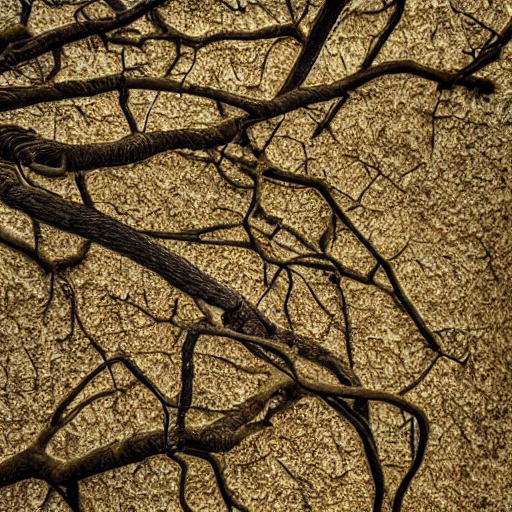

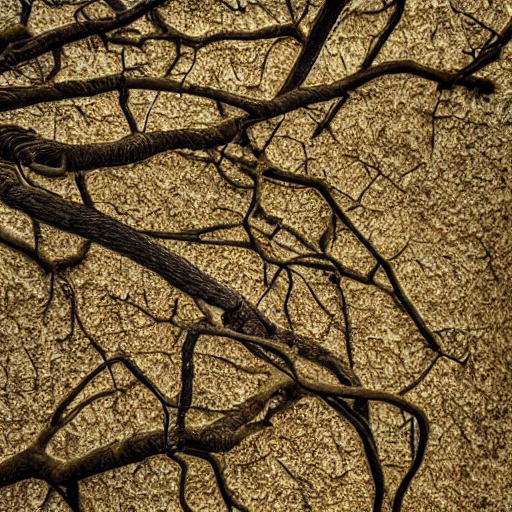

In [8]:
result[0].show()
result[1].show()

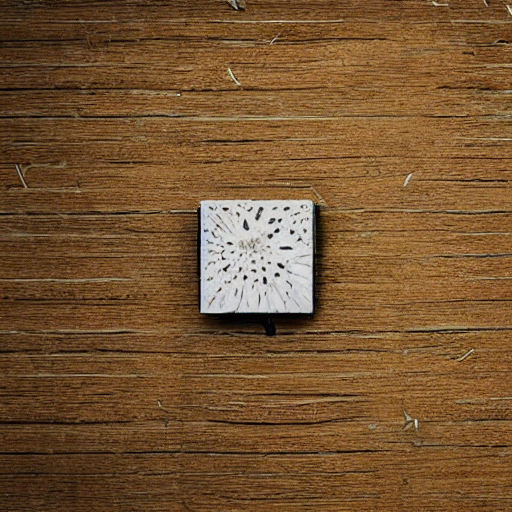

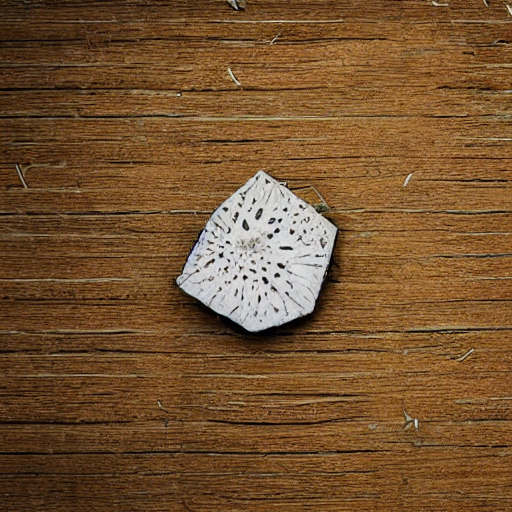

In [14]:
result[0].show()
result[1].show()

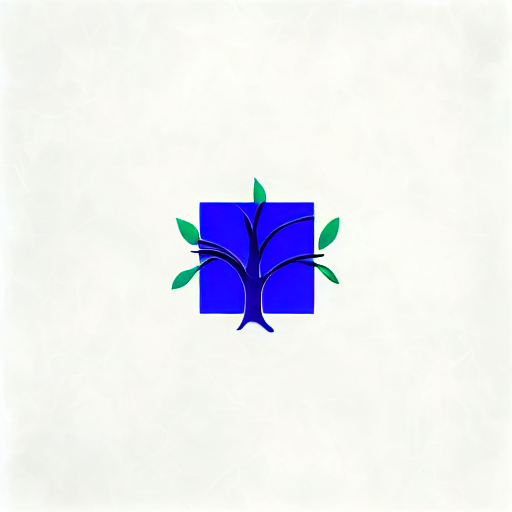

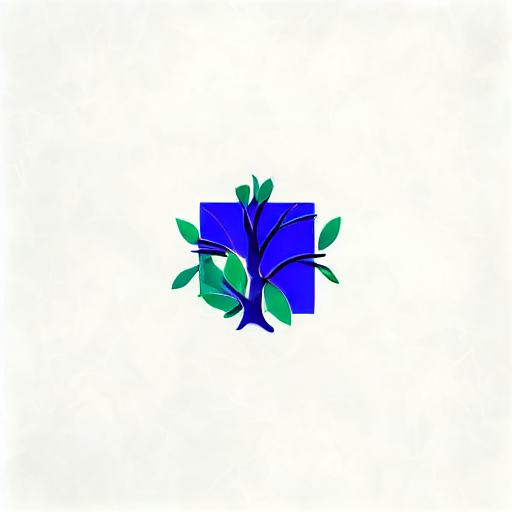

In [12]:
result[0].show()
result[1].show()

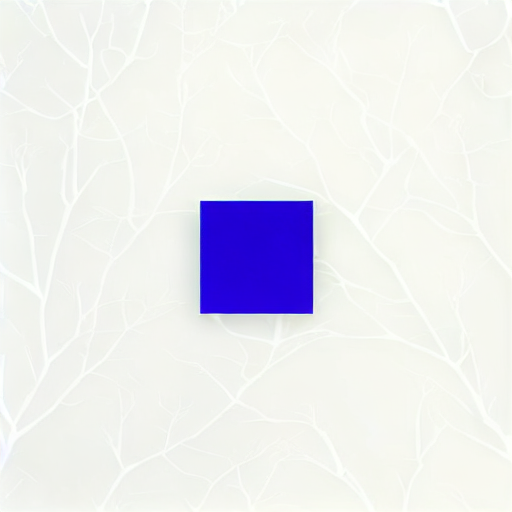

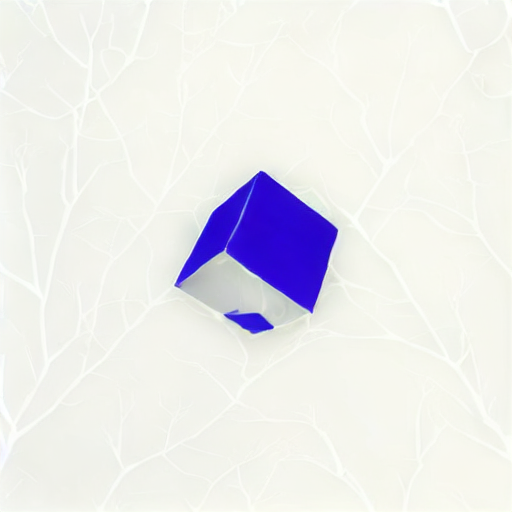

In [16]:
result[0].show()
result[1].show()

In [51]:
pose_images

[<PIL.Image.Image image mode=RGB size=512x512 at 0x7F8390D9D0A0>,
 <PIL.Image.Image image mode=RGB size=512x512 at 0x7F8390D9D310>]

0.0


  0%|          | 0/50 [00:00<?, ?it/s]

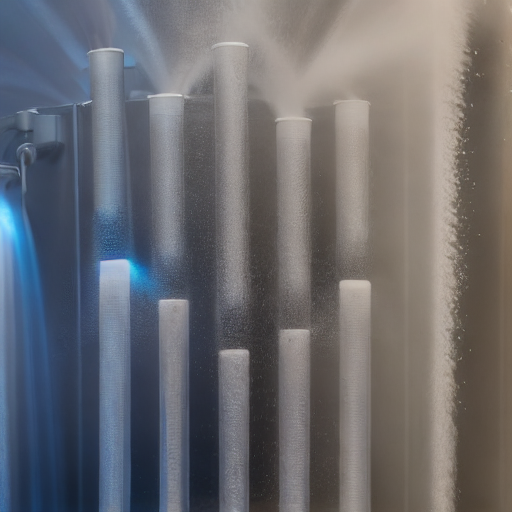

0.10471443862370107


  0%|          | 0/50 [00:00<?, ?it/s]

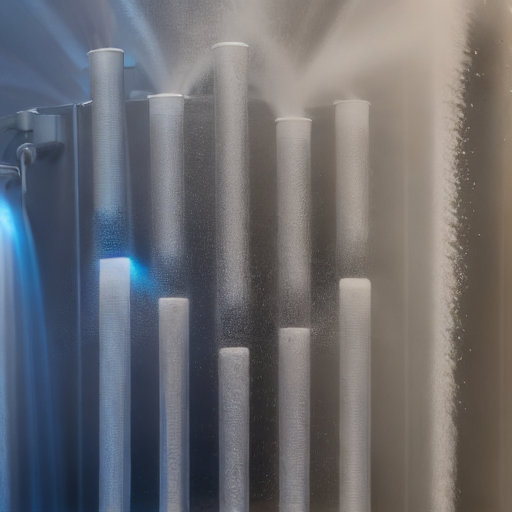

0.2093969802150058


  0%|          | 0/50 [00:00<?, ?it/s]

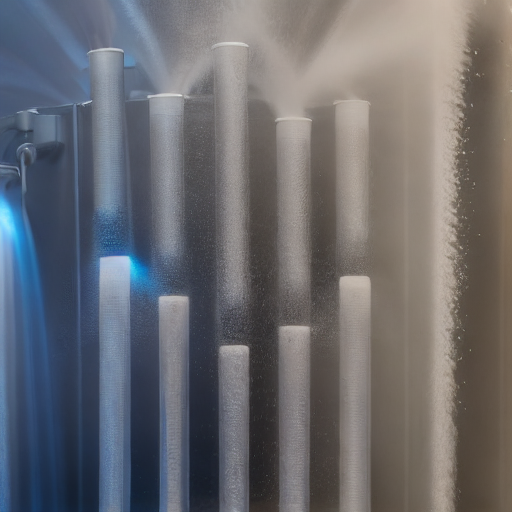

0.314015737457663


  0%|          | 0/50 [00:00<?, ?it/s]

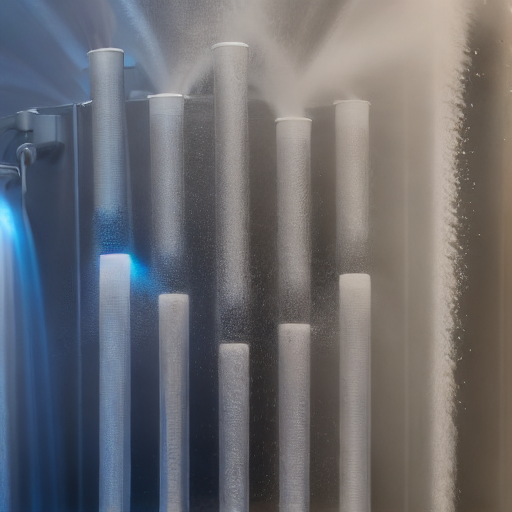

0.4185388424647518


  0%|          | 0/50 [00:00<?, ?it/s]

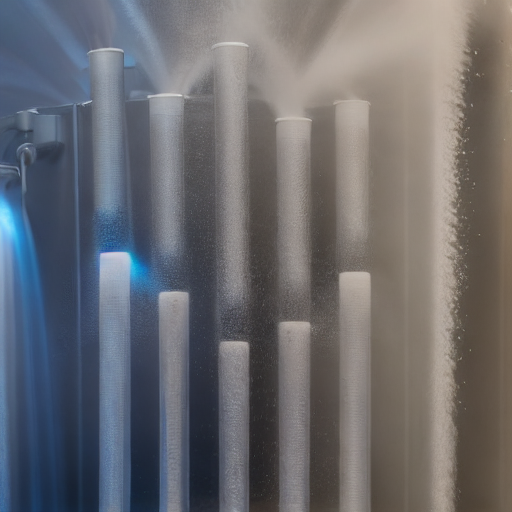

0.522934456485949


  0%|          | 0/50 [00:00<?, ?it/s]

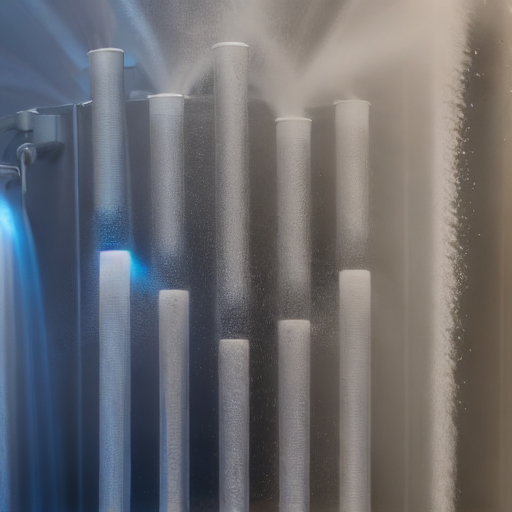

0.6271707796059208


  0%|          | 0/50 [00:00<?, ?it/s]

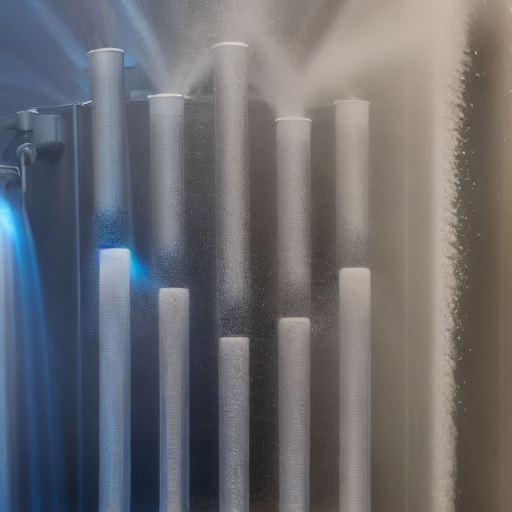

0.7312160604308848


  0%|          | 0/50 [00:00<?, ?it/s]

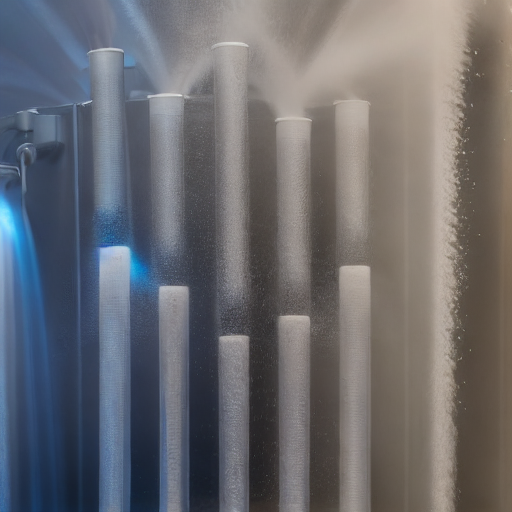

0.8350386057603927


  0%|          | 0/50 [00:00<?, ?it/s]

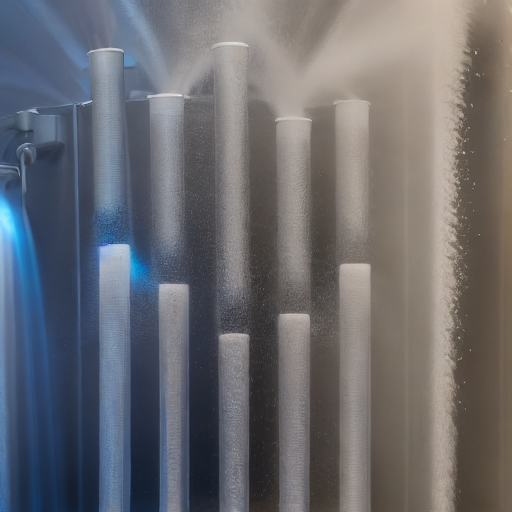

0.9386067902413853


  0%|          | 0/50 [00:00<?, ?it/s]

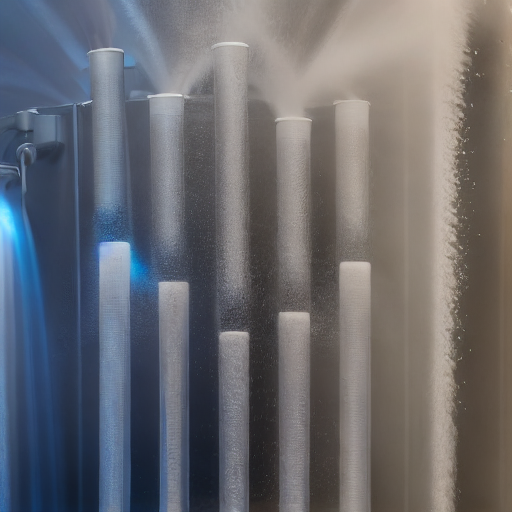

1.041889066001582


  0%|          | 0/50 [00:00<?, ?it/s]

1.1448539722592688


  0%|          | 0/50 [00:00<?, ?it/s]

1.247470144906556


  0%|          | 0/50 [00:00<?, ?it/s]

1.34970632606319


  0%|          | 0/50 [00:00<?, ?it/s]

1.4515313735980064


  0%|          | 0/50 [00:00<?, ?it/s]

1.5529142706151244


  0%|          | 0/50 [00:00<?, ?it/s]

1.653824134901995


  0%|          | 0/50 [00:00<?, ?it/s]

1.7542302283364206


  0%|          | 0/50 [00:00<?, ?it/s]

1.8541019662496843


  0%|          | 0/50 [00:00<?, ?it/s]

1.9534089267429402


  0%|          | 0/50 [00:00<?, ?it/s]

2.0521208599540124


  0%|          | 0/50 [00:00<?, ?it/s]

2.1502076972718016


  0%|          | 0/50 [00:00<?, ?it/s]

2.247639560495472


  0%|          | 0/50 [00:00<?, ?it/s]

2.3443867709356425


  0%|          | 0/50 [00:00<?, ?it/s]

2.4404198584548014


  0%|          | 0/50 [00:00<?, ?it/s]

2.5357095704441965


  0%|          | 0/50 [00:00<?, ?it/s]

2.6302268807344644


  0%|          | 0/50 [00:00<?, ?it/s]

2.7239429984372805


  0%|          | 0/50 [00:00<?, ?it/s]

2.816829376715345


  0%|          | 0/50 [00:00<?, ?it/s]

2.9088577214780225


  0%|          | 0/50 [00:00<?, ?it/s]

2.9999999999999996


  0%|          | 0/50 [00:00<?, ?it/s]

3.0902284494603247


  0%|          | 0/50 [00:00<?, ?it/s]

3.1795155853992294


  0%|          | 0/50 [00:00<?, ?it/s]

3.2678342100901627


  0%|          | 0/50 [00:00<?, ?it/s]

3.355157420824481


  0%|          | 0/50 [00:00<?, ?it/s]

3.4414586181062763


  0%|          | 0/50 [00:00<?, ?it/s]

3.526711513754839


  0%|          | 0/50 [00:00<?, ?it/s]

3.6108901389122896


  0%|          | 0/50 [00:00<?, ?it/s]

3.69396885195395


  0%|          | 0/50 [00:00<?, ?it/s]

3.7759223462990246


  0%|          | 0/50 [00:00<?, ?it/s]

3.8567256581192355


  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
import math
reader = imageio.get_reader('output.mp4', "ffmpeg")
frame_count = reader.count_frames()


prompt = "five pumping water streams, fantastic photograph, 4k, in the white background"
results = []
xm = 6
ym = 6
for i in range(41):
  generator = torch.Generator(device='cuda', )
  generator.manual_seed(19) 
  pose_images = [cannyExtractor(Image.fromarray(reader.get_data(i))) for i in [0,i]]


# fix latents for all frames
  latents = torch.randn((1, 4, 64, 64), device="cuda", dtype=torch.float16, generator= generator).repeat(len(pose_images), 1, 1, 1)
  latents = create_motion_field_and_warp_latents(motion_field_strength_x = 0, motion_field_strength_y = 0, latents = latents, frame_ids= list(range(len(latents))))
  print(xm*math.sin(math.pi/180*i))
  cur = pipe(prompt=[prompt] * len(pose_images), image=pose_images, latents=latents, generator=generator).images
  if i<10:
    cur[1].show()
  results.append(cur[1])
  if i%10==0:
    imageio.mimsave("video"+str(i)+".mp4", results, fps=30)
imageio.mimsave("video.mp4", results, fps=30)

/usr/local/lib/python3.9/dist-packages/transformers/pipelines/base.py:1070: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torch/nn/functional.py:4236: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


  0%|          | 0/50 [00:00<?, ?it/s]

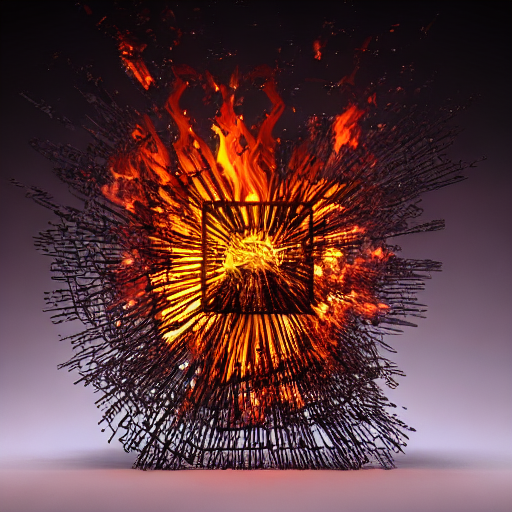

  0%|          | 0/50 [00:00<?, ?it/s]

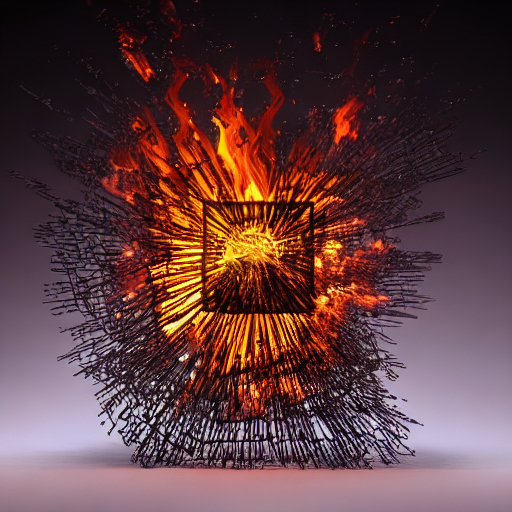

  0%|          | 0/50 [00:00<?, ?it/s]

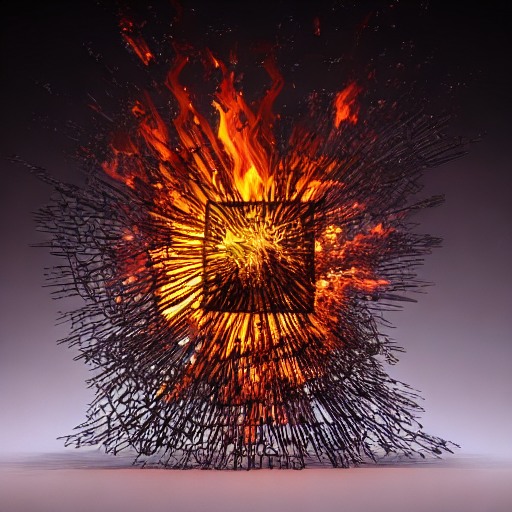

  0%|          | 0/50 [00:00<?, ?it/s]

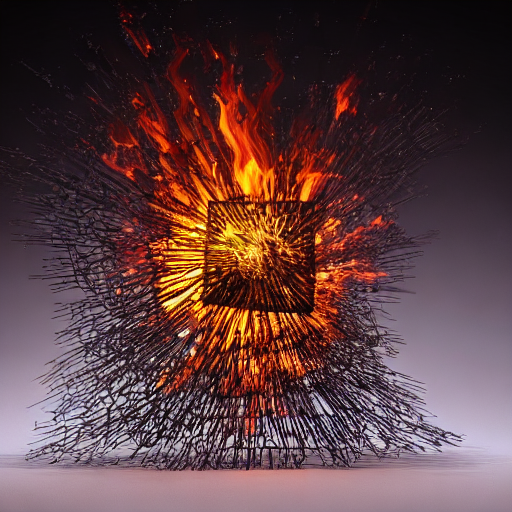

  0%|          | 0/50 [00:00<?, ?it/s]

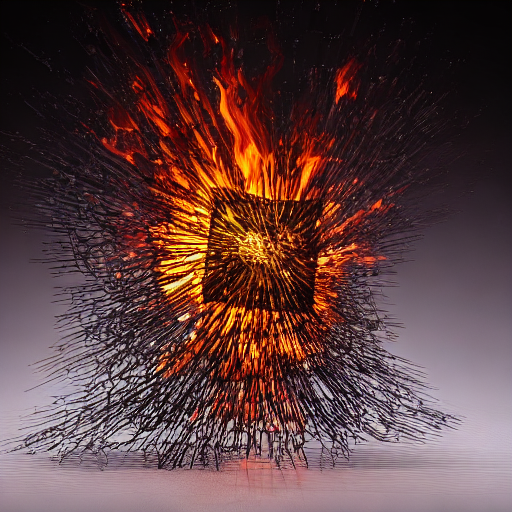

  0%|          | 0/50 [00:00<?, ?it/s]

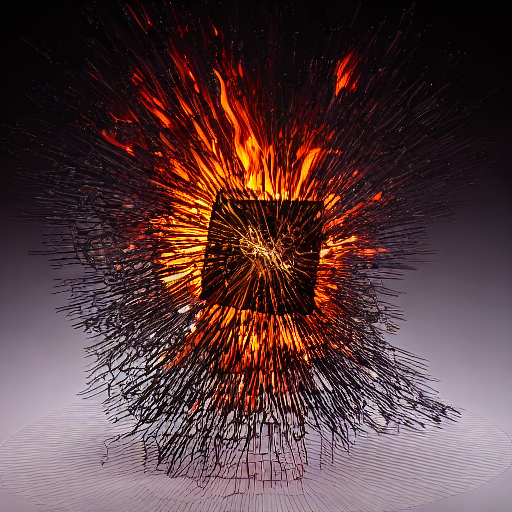

  0%|          | 0/50 [00:00<?, ?it/s]

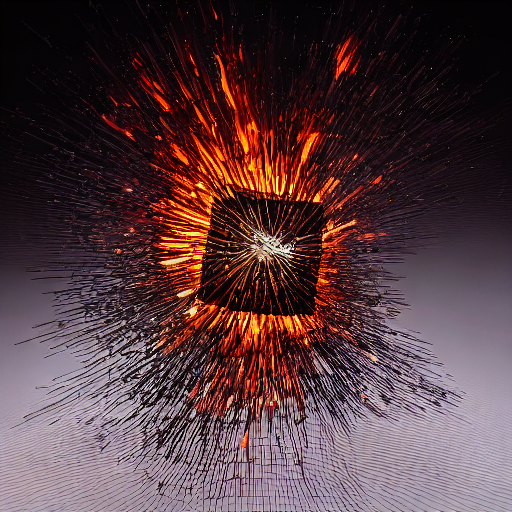

  0%|          | 0/50 [00:00<?, ?it/s]

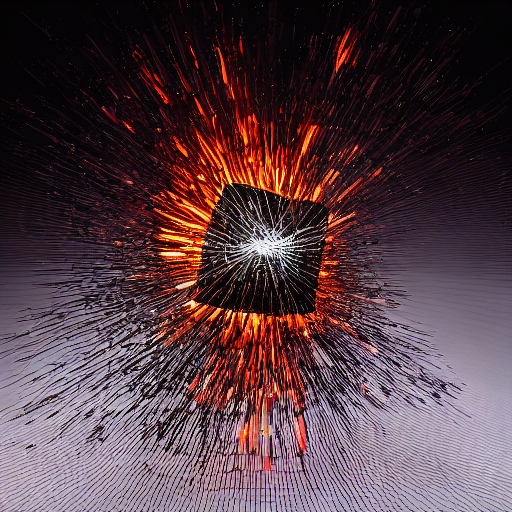

  0%|          | 0/50 [00:00<?, ?it/s]

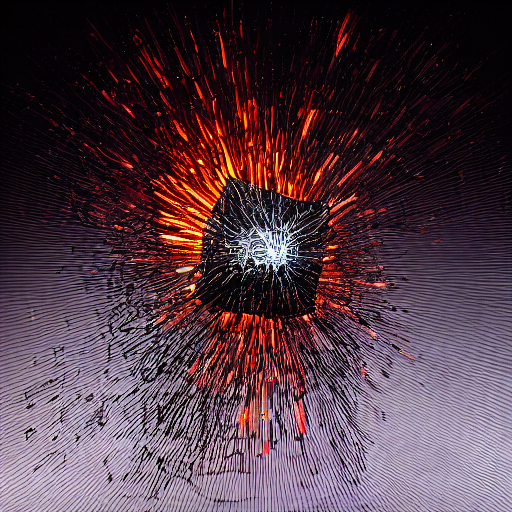

  0%|          | 0/50 [00:00<?, ?it/s]

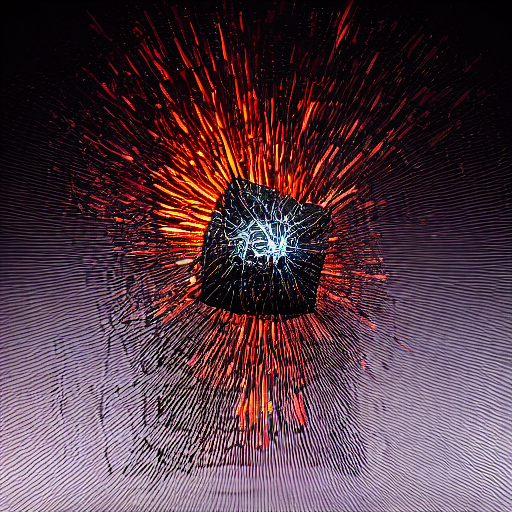

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
# interpolation testing
device = 'cuda'
def handle_prompts(prompts, prompt_weights):
  if len(prompts)==1 and len(prompt_weights)==0:
    return prompts[0]
  elif len(prompts)>1 or len(prompt_weights)==1:
    text_input = pipe.tokenizer(prompts, padding="max_length", max_length=pipe.tokenizer.model_max_length, truncation=True, return_tensors="pt")
    with torch.no_grad():
      text_embeddings = pipe.text_encoder(text_input.input_ids.to(device))[0]

    if len(prompt_weights) <=1:
      text_embeddings = torch.mean(text_embeddings, dim=0)
    elif len(prompt_weights) > 1:
      prompt_weights = torch.Tensor(prompt_weights).to(device)
      text_embeddings = torch.sum(text_embeddings * prompt_weights[:, None, None], dim=0)/torch.sum(prompt_weights)

    return torch.reshape(text_embeddings, (1, text_embeddings.shape[0], text_embeddings.shape[1]))

import math
reader = imageio.get_reader('output.mp4', "ffmpeg")
frame_count = reader.count_frames()


# prompt = "a spinning glass cube on exploding fire, in matte textured 3d unreal rendering, 4k, in the white background"
prompt = ["a spinning glass cube on exploding fire, in matte textured 3d unreal rendering, 4k, in the white background", 
          "a spinning glass cube on exploding water, in matte textured 3d unreal rendering, 4k, in the white background"]



results = []
xm = 12
ym = 12
for i in range(40):
  generator = torch.Generator(device='cuda', )
  generator.manual_seed(147) 
  pose_images = [depthExtractor(Image.fromarray(reader.get_data(i))) for i in [0,i]]
  prompt_embed = handle_prompts(prompt, [1-1/40*i, 1/40*i])

# fix latents for all frames
  latents = torch.randn((1, 4, 64, 64), device="cuda", dtype=torch.float16, generator= generator).repeat(len(pose_images), 1, 1, 1)
  latents = create_motion_field_and_warp_latents(motion_field_strength_x = 0, motion_field_strength_y = ym*i, latents = latents, frame_ids= list(range(len(latents))))
  # print(xm*math.sin(math.pi/180*i))
  cur = pipe(prompt_embeds=prompt_embed, image=pose_images, latents=latents, generator=generator).images
  if i<10:
    cur[1].show()
  results.append(cur[1])
  if i%10==0:
    imageio.mimsave("video"+str(i)+".mp4", results, fps=30)
imageio.mimsave("video.mp4", results, fps=30)

In [ ]:
# imageio.mimsave("video.mp4", results, fps=30)
cur[]

[<PIL.Image.Image image mode=RGB size=512x512 at 0x7FF7D98395E0>,
 <PIL.Image.Image image mode=RGB size=512x512 at 0x7FF7D98391F0>]

In [ ]:
from diffusers.pipelines.text_to_video_synthesis.pipeline_text_to_video_zero import create_motion_field_and_warp_latents
i=70
generator = torch.Generator(device='cuda', )
generator.manual_seed(147) 
pose_images = [depthExtractor(Image.fromarray(reader.get_data(i))) for i in [0,1,2]]


# fix latents for all frames
latents = torch.randn((1, 4, 64, 64), device="cuda", dtype=torch.float16, generator= generator).repeat(len(pose_images), 1, 1, 1)
latents = create_motion_field_and_warp_latents(motion_field_strength_x = 120, motion_field_strength_y = 120, latents = latents, frame_ids= list(range(len(latents))))
  
cur = pipe(prompt=[prompt] * len(pose_images), image=pose_images, latents=latents, generator=generator).images

  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:

i=70
generator = torch.Generator(device='cuda', )
generator.manual_seed(147) 
pose_images = [depthExtractor(Image.fromarray(reader.get_data(i))) for i in [0,1]]


# fix latents for all frames
latents = torch.randn((1, 4, 64, 64), device="cuda", dtype=torch.float16, generator= generator).repeat(len(pose_images), 1, 1, 1)
latents = create_motion_field_and_warp_latents(motion_field_strength_x = 240, motion_field_strength_y = 240, latents = latents, frame_ids= list(range(len(latents))))
  
cur = pipe(prompt=[prompt] * len(pose_images), image=pose_images, latents=latents, generator=generator).images

  0%|          | 0/50 [00:00<?, ?it/s]

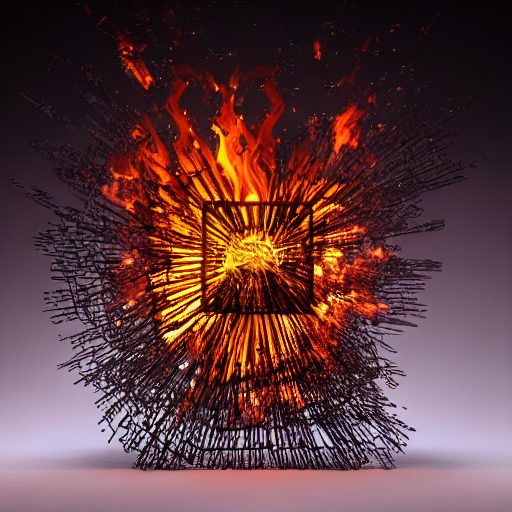

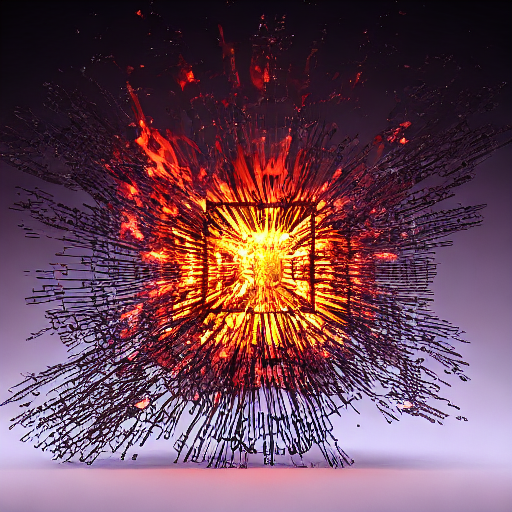

In [ ]:
for i in range(len(cur)):
  cur[i].show()

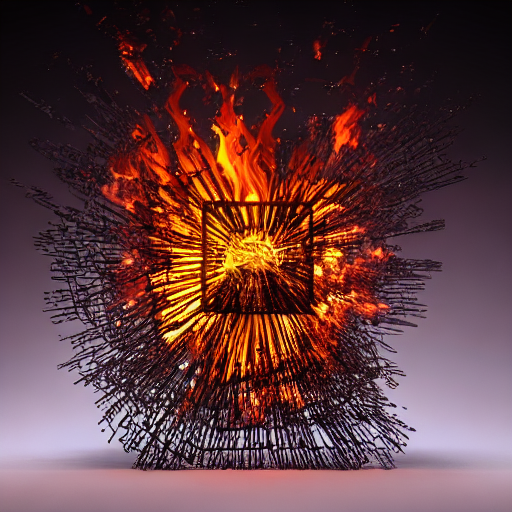

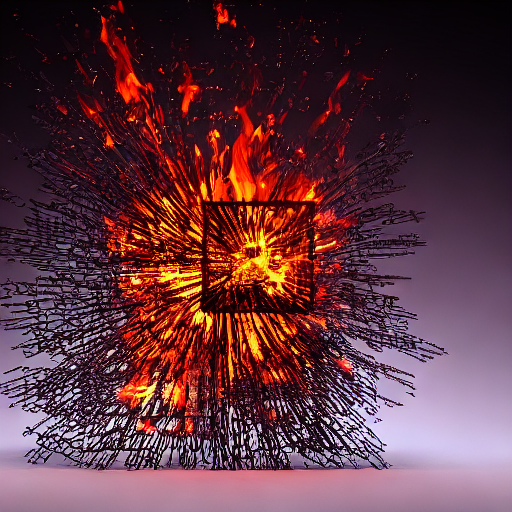

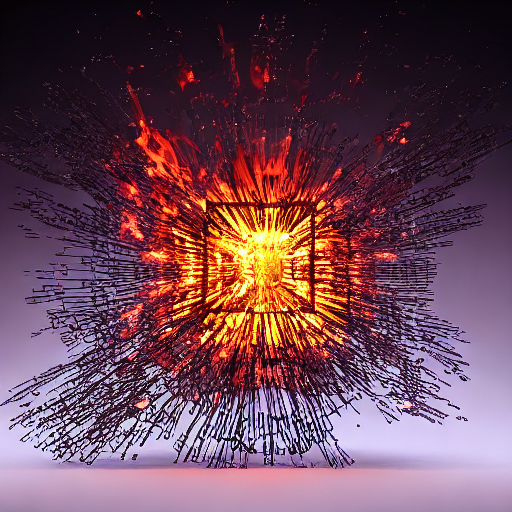

In [ ]:
for i in range(len(cur)):
  cur[i].show()